## PERCS Analysis Notebook

Started 5 Dec 2022

Notess:
- 5 Dec 

In [20]:
import os
import re
import warnings
import numpy as np
import pandas as pd
import sympy as sym
from os.path import join
from six import iteritems
import matplotlib.pyplot as plt
import csv
from scipy import stats
from sklearn import cluster, metrics, decomposition # these will be useful
import seaborn as sns
import sklearn
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.cm as cm
import seaborn as sns
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.pyplot as plt
import altair as alt


### FOrming Percs Dataframe

In [21]:
data_dir = os.path.abspath("data")
dir = os.path.abspath("")

In [22]:
data_dir

'c:\\Users\\sicil\\LiverModel\\data'

In [23]:
csv_percs = os.path.join(data_dir,"percs_df.csv")
percs_df = pd.read_csv(csv_percs,index_col="RXN")
csv_percs


'c:\\Users\\sicil\\LiverModel\\data\\percs_df.csv'

In [24]:
percs_df

,OG,No.0,No.1,No.2,No.3,No.4,No.5,No.6,No.7,No.8,...,No.4990,No.4991,No.4992,No.4993,No.4994,No.4995,No.4996,No.4997,No.4998,No.4999
RXN,,,,,,,,,,,,,,,,,,,,,
kf_HEX1,2.018015e+04,4.258354e+03,2.940531e+03,1.996763e+03,2.278241e+03,6.728423e+04,1.414944e+04,1.296080e+05,8.693189e+05,2.434222e+05,...,2.105130e+03,4.649164e+03,2.460805e+03,4.409023e+03,6.616226e+04,1.701004e+04,4.424634e+04,3.768858e+03,1.697786e+03,1.123819e+03
kf_PGI,5.880895e+03,5.511449e+02,5.168686e+02,6.340910e+03,6.306921e+03,9.601131e+03,7.230486e+03,8.950118e+02,3.438222e+03,2.131030e+03,...,4.273827e+02,5.787588e+02,8.657329e+02,6.498446e+03,1.824487e+04,6.193030e+03,1.082129e+04,1.342941e+03,1.378876e+03,1.222000e+03
kf_FBP,1.000000e+05,1.000000e+05,1.000000e+05,1.000000e+05,1.000000e+05,1.000000e+05,1.000000e+05,1.000000e+05,1.000000e+05,1.000000e+05,...,1.000000e+05,1.000000e+05,1.000000e+05,1.000000e+05,1.000000e+05,1.000000e+05,1.000000e+05,1.000000e+05,1.000000e+05,1.000000e+05
kf_PFK,3.197816e+06,1.377600e+05,1.210078e+07,5.624837e+06,4.528822e+06,1.296254e+07,4.327022e+06,1.465452e+07,4.166935e+07,2.691073e+07,...,4.678343e+06,3.851228e+06,1.660424e+06,5.964869e+06,1.978505e+07,5.775647e+06,2.746167e+07,3.070726e+05,3.661451e+06,2.584233e+06
kf_FBA,1.943647e+04,2.257384e+04,8.439185e+03,1.931098e+04,3.764272e+03,5.964158e+04,1.768405e+04,9.531945e+03,9.724054e+03,3.348939e+03,...,3.235229e+04,4.949633e+04,3.926027e+04,2.267309e+04,1.574766e+04,1.479954e+04,5.000214e+04,1.345114e+04,1.787054e+04,1.932680e+04
kf_TPI,6.486470e+03,9.195787e+02,2.936766e+03,3.740340e+03,2.157476e+03,1.902437e+03,6.393250e+02,1.592953e+03,6.873179e+02,1.351270e+03,...,1.333399e+03,2.997531e+03,3.102558e+03,2.886951e+03,7.500419e+02,1.653360e+03,8.288930e+02,2.915472e+03,1.162371e+03,1.174079e+03
kf_GAPD,5.434709e+09,6.101805e+08,3.258215e+08,2.241215e+08,1.021928e+09,2.701030e+10,3.044747e+09,2.348937e+08,1.371384e+09,9.393502e+08,...,2.955646e+08,3.186582e+09,1.040752e+10,6.052996e+09,3.129107e+09,5.613800e+09,3.099558e+09,8.050908e+09,4.772785e+09,6.293462e+09
kf_PGK,2.530817e+09,4.460508e+09,4.152088e+09,6.502157e+07,8.100133e+08,3.155932e+09,3.541881e+09,3.786175e+09,3.863429e+10,1.300681e+10,...,1.573125e+09,6.929308e+09,2.054514e+09,1.642624e+09,9.189568e+09,4.258858e+09,3.814346e+09,1.111761e+09,8.893125e+08,7.185911e+08
kf_PGM,2.803163e+03,2.582658e+03,7.266611e+02,2.617806e+02,7.086623e+03,3.701094e+03,1.011620e+04,2.034944e+02,1.950353e+02,1.871641e+02,...,1.921693e+02,3.338922e+02,4.909897e+02,3.146334e+02,1.965656e+02,2.735421e+02,1.957958e+02,3.661141e+02,2.024464e+02,2.632221e+02


Log transforming it

In [25]:
data_log = np.log(percs_df)
data_log

,OG,No.0,No.1,No.2,No.3,No.4,No.5,No.6,No.7,No.8,...,No.4990,No.4991,No.4992,No.4993,No.4994,No.4995,No.4996,No.4997,No.4998,No.4999
RXN,,,,,,,,,,,,,,,,,,,,,
kf_HEX1,9.912455,8.356638,7.986346,7.599283,7.731159,11.116681,9.557430,11.772270,13.675465,12.402552,...,7.652132,8.444443,7.808244,8.391408,11.099865,9.741559,10.697528,8.234527,7.437080,7.024488
kf_PGI,8.679464,6.311998,6.247789,8.754778,8.749403,9.169636,8.886062,6.796837,8.142710,7.664361,...,6.057680,6.360886,6.763576,8.779318,9.811639,8.731180,9.289271,7.202617,7.229024,7.108244
kf_FBP,11.512925,11.512925,11.512925,11.512925,11.512925,11.512925,11.512925,11.512925,11.512925,11.512925,...,11.512925,11.512925,11.512925,11.512925,11.512925,11.512925,11.512925,11.512925,11.512925,11.512925
kf_PFK,14.977979,11.833268,16.308780,15.542703,15.325973,16.377574,15.280390,16.500260,17.545276,17.108036,...,15.358455,15.163903,14.322584,15.601398,16.800437,15.569161,17.128302,12.634839,15.113370,14.764939
kf_FBA,9.874907,10.024547,9.040641,9.868429,8.233310,10.996108,9.780418,9.162404,9.182358,8.116399,...,10.384440,10.809654,10.577968,10.028934,9.664447,9.602351,10.819821,9.506819,9.790909,9.869248
kf_TPI,8.777474,6.823916,7.985064,8.226932,7.676694,7.550891,6.460413,7.373345,6.532797,7.208800,...,7.195487,8.005544,8.039982,7.967956,6.620129,7.410565,6.720091,7.977787,7.058217,7.068239
kf_GAPD,22.416072,20.229265,19.601860,19.227699,20.744957,24.019484,21.836684,19.274644,21.039086,20.660699,...,19.504398,21.882215,23.065795,22.523819,21.864013,22.448494,21.854525,22.809051,22.286196,22.562777
kf_PGK,21.651808,22.218528,22.146877,17.990230,20.512561,21.872550,21.987924,22.054622,24.377406,23.288739,...,21.176330,22.659026,21.443305,21.219561,22.941335,22.172267,22.062035,20.829211,20.605959,20.392803
kf_PGM,7.938504,7.856574,6.588460,5.567507,8.865964,8.216384,9.221894,5.315639,5.273181,5.231986,...,5.258377,5.810818,6.196423,5.751408,5.280996,5.611456,5.277072,5.902945,5.310475,5.572998


In [26]:
data_norm = sklearn.preprocessing.normalize(percs_df,norm='l2')
data_norm= pd.DataFrame(data_norm)

In [27]:
data_vis = data_norm.melt()
data_vis.columns = ["RXN", "val"]

In [28]:
data_log
data_norm_log = data_log.T
data_norm_log.columns = [data_log.index]
data_norm_log

RXN,kf_HEX1,kf_PGI,kf_FBP,kf_PFK,kf_FBA,kf_TPI,kf_GAPD,kf_PGK,kf_PGM,kf_ENO,kf_PYK,kf_LDH_L,kf_ATPM,kf_NADHM
OG,9.912455,8.679464,11.512925,14.977979,9.874907,8.777474,22.416072,21.651808,7.938504,9.922659,15.102663,12.026940,6.047581,11.512925
No.0,8.356638,6.311998,11.512925,11.833268,10.024547,6.823916,20.229265,22.218528,7.856574,9.807841,17.332909,10.644153,4.692795,11.512925
No.1,7.986346,6.247789,11.512925,16.308780,9.040641,7.985064,19.601860,22.146877,6.588460,8.605252,17.369717,10.021386,5.479445,11.512925
No.2,7.599283,8.754778,11.512925,15.542703,9.868429,8.226932,19.227699,17.990230,5.567507,7.310319,12.524205,8.882747,4.508229,11.512925
No.3,7.731159,8.749403,11.512925,15.325973,8.233310,7.676694,20.744957,20.512561,8.865964,10.604994,16.013329,12.108217,4.345037,11.512925
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
No.4995,9.741559,8.731180,11.512925,15.569161,9.602351,7.410565,22.448494,22.172267,5.611456,7.726067,13.956591,12.537002,5.764563,11.512925
No.4996,10.697528,9.289271,11.512925,17.128302,10.819821,6.720091,21.854525,22.062035,5.277072,7.477376,14.219179,11.612008,6.232280,11.512925
No.4997,8.234527,7.202617,11.512925,12.634839,9.506819,7.977787,22.809051,20.829211,5.902945,7.892593,14.809524,14.216836,4.302443,11.512925
No.4998,7.437080,7.229024,11.512925,15.113370,9.790909,7.058217,22.286196,20.605959,5.310475,7.303291,13.739083,14.291836,4.329816,11.512925


In [29]:
data_vis_log = data_norm_log.melt()
data_vis_log.columns = ["RXN", "val"]
data_vis_log

,RXN,val
0,kf_HEX1,9.912455
1,kf_HEX1,8.356638
2,kf_HEX1,7.986346
3,kf_HEX1,7.599283
4,kf_HEX1,7.731159
...,...,...
70009,kf_NADHM,11.512925
70010,kf_NADHM,11.512925
70011,kf_NADHM,11.512925
70012,kf_NADHM,11.512925


In [30]:
# Violin Plot of log transofmred data 
alt.data_transformers.disable_max_rows()
alt.Chart(data_vis_log).transform_density(
    'val',
    as_=['Value_column', 'density'],
    # extent=[-0.1, 0.1],
    groupby=['RXN']
).mark_area(orient='horizontal').encode(
    y=alt.Y(
        'Value_column:Q', scale=alt.Scale(type='log'),
                axis=alt.Axis(
            # labels=False, 
            # values=[0],
        grid=False,
         ticks=True)
        ),
    color='RXN:N',
    x=alt.X(
        'density:Q',
        stack='center',
        impute=None,
        title=None,
        axis=alt.Axis(labels=False, values=[0],grid=False, ticks=True),
    ),
    tooltip=['RXN:N', "Value_column:Q"], 
    column=alt.Column(
        'RXN:N',
        header=alt.Header(
            titleOrient='bottom',
            labelOrient='bottom',
            labelPadding=0,
        ),
    )
).properties(
    width=50
).configure_facet(
    spacing=0
).configure_view(
    stroke=None
).interactive()

alt.Chart(...)

In [31]:


def PCA_cluster_plot(data, cluster_labels, ax = None):
    """
    Parameters:
        data: the pd.DataFrame of gene expression data
        cluster_labels: a pd.Series with a cluster label
            for each column of data
        ax: if None, draw a new figure. else, populate these axes.
    Returns:
        ax: the plt.axes object of a PCA plot labeled by cluster
    """
    
    # check for bad input
    if isinstance(cluster_labels, pd.Series):
        if not(cluster_labels.index.equals(data.columns)):
            raise ValueError('cluster_labels.index doesn\'t match data.columns')
    else:
        raise TypeError('cluster_labels isn\'t a pd.Series')
    
    # compute PCA, save as dataframe with condition labels
    # data_norm = stats.zscore(data, axis=1)
    data_norm = sklearn.preprocessing.normalize(percs_df,norm='l2')
    data_pc = PCA().fit_transform(data_norm.T)
    data_pc = pd.DataFrame(data_pc, index = data.columns)
    
    # get the unique clusters (supports naming if desired)
    unique_clusters = np.sort(cluster_labels.unique())
    
    # prepare a long list of colors
    colors = ['tab:blue','tab:orange','tab:green','tab:red','tab:purple',
              'tab:brown','tab:pink','tab:gray','tab:olive', 'tab:cyan',
              'black', 'salmon', 'chocolate', 'orange', 'gold', 'lawngreen',
              'turquoise', 'steelblue', 'navy', 'violet', 'deeppink',
              'firebrick', 'sandybrown','olivedrab','darkgreen', 'aqua',
              'slategray', 'blue', 'fuschia', 'pink']
    
    # this code only runs if you have a ton of labels
    while len(colors) < len(cluster_labels.unique()):
        colors = colors + colors
    
    # make the plot
    if ax is None:
        fig, ax = plt.subplots()
    ax.set_xlabel('PC1', fontsize = 16)
    ax.set_ylabel('PC2', fontsize = 16)
    
    # iterate through each cluster label
    for clust, color in zip(unique_clusters, colors):
        
        # get the samples of this cluster
        samples = cluster_labels.index[cluster_labels == clust]
        
        # add to plot
        ax.scatter(data_pc.loc[samples, 0],
                   data_pc.loc[samples, 1],
                   label = clust, color = color)
    
    # add legend
    ax.legend(bbox_to_anchor = (1,1))
    
    return ax

In [32]:
# Violin Plot of percs distribution without log tranforming
alt.Chart(data_vis).transform_density(
    'val',
    as_=['Value_column', 'density'],     extent=[-0.1, 0.5],
    groupby=['RXN']
    ).mark_area(orient='horizontal').encode(
    y=alt.Y('Value_column:Q',axis=alt.Axis(grid=False,ticks=True)),
    color='RXN:N',
    x=alt.X('density:Q', stack='center',impute=None,
        title=None,
        axis=alt.Axis(labels=False, values=[0],grid=False, ticks=True)),
        tooltip=['RXN:N', "Value_column:Q"], 
    column=alt.Column(
        'RXN:N',header=alt.Header(
            titleOrient='bottom',
            labelOrient='bottom',
            labelPadding=0))
).properties(
    width=50).configure_facet(spacing=0).configure_view(stroke=None).interactive()

alt.Chart(...)

In [33]:
k10_clusters = cluster.KMeans(n_clusters =10, random_state = 1)

# compute the clusters
# use the transpose of the data to get samples instead of genes
k10_clusters = k10_clusters.fit(data_log)

# label the output with condition names
k10_labels = pd.Series(k10_clusters.labels_, index = data_log.index)

In [34]:
# ANSWER    

ax = PCA_cluster_plot(data_log, k10_labels)

ValueError: cluster_labels.index doesn't match data.columns

#### Creating elbow method to find optimal k clusters

In [35]:
# create a DataFrame to store all the clusters
k_range = range(2, 51)
elbow_df = pd.DataFrame(index = percs_df.columns, 
                        columns = k_range)

# compute the clusters at each k
for k in k_range:
    
    # repeat code from problem 1.2.1
    k_clusters = cluster.KMeans(n_clusters = k, random_state = 1)
    k_clusters = k_clusters.fit(percs_df.T)
    
    # store in DataFrame
    elbow_df[k] = k_clusters.labels_

In [36]:
elbow_df

,2,3,4,5,6,7,8,9,10,11,...,41,42,43,44,45,46,47,48,49,50
OG,0,0,0,0,0,0,0,0,3,1,...,31,21,29,23,20,29,43,0,29,46
No.0,0,0,0,0,0,0,0,0,3,1,...,9,5,40,27,44,11,18,30,18,34
No.1,0,0,0,0,0,0,0,0,3,1,...,9,39,40,27,44,11,18,30,18,34
No.2,0,0,0,0,0,0,0,0,3,1,...,18,18,0,7,0,25,0,16,21,27
No.3,0,0,0,0,0,0,0,0,3,1,...,18,18,0,7,0,25,0,16,21,27
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
No.4995,0,0,0,0,0,0,0,0,3,1,...,38,29,35,1,11,40,11,5,40,11
No.4996,0,0,0,0,0,0,0,0,3,1,...,38,5,35,1,44,40,11,5,18,11
No.4997,0,0,0,0,0,0,0,0,3,8,...,4,0,14,23,20,29,43,0,29,46
No.4998,0,0,0,0,0,0,0,0,3,1,...,31,21,29,37,36,3,44,0,29,46


Optimal K = 10


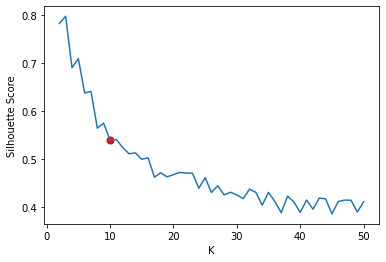

In [37]:
# compute the silhouette scores
k_silhouette = pd.Series(index = k_range, dtype=float)

for k in k_range:
    k_silhouette[k] = metrics.silhouette_score(percs_df.T, elbow_df[k])
    
# plot
fig, ax = plt.subplots()
ax.plot(k_range, k_silhouette)

# output, look at plot, and pick the best k
# I think it is k = 22
# so I'll draw it on now
best_k = 10
ax.scatter(best_k, k_silhouette[best_k], color = 'r', s = 50)
ax.set_xlabel('K')
ax.set_ylabel('Silhouette Score')

print('Optimal K =', best_k)

try with more sample size,
possibly could smooth out above graph,
could export percs df as csv so i dont have to rerun it


In [38]:
# mean_silhouette = pd.Series(index = k_range, dtype=float)

# # increase this number to make the curve smoother
# # requires a lot of time to run
# num_repeats = 10

# for k in k_range:
#     k_scs = []
#     for i in range(num_repeats):
#         # DO NOT specify a random state so we intentionally 
#         # get different results
#         k_clusters = cluster.KMeans(n_clusters = k)
#         k_clusters = k_clusters.fit(percs_df.T)
        
#         # add this silhouette score
#         k_scs += [metrics.silhouette_score(percs_df.T, k_clusters.labels_)]
    
#     # take the mean silhouette score
#     mean_silhouette[k] = np.mean(k_scs)

In [39]:
# fig, ax = plt.subplots()
# ax.plot(k_range, mean_silhouette)
# ax.set_xlabel('K')
# ax.set_ylabel('Mean Silhouette Score')

# # this reduces our k slightly
# best_k = 21
# ax.scatter(best_k, mean_silhouette[best_k], color = 'r', s = 50)

In [40]:
# normalize the data
# data_norm = pd.DataFrame(stats.zscore(data_log, axis = 1), 
                        #  columns = data_log.columns, index = data_log.index)

data_norm = sklearn.preprocessing.normalize(percs_df,norm='l2')
data_norm= pd.DataFrame(data_norm)

In [41]:
data_norm = data_norm.T
data_norm.columns = [data_log.index]
# data_norm

In [42]:
data_vis = data_norm.melt()
data_vis.columns = ["RXN", "val"]
# data_vis

Overlaps of PERC values

In [43]:
import altair as alt

In [44]:
data_vis = data_norm.melt()
data_vis.columns = ["RXN", "val"]
alt.data_transformers.disable_max_rows()

DataTransformerRegistry.enable('default')

In [45]:
fig = alt.Chart(data_vis).mark_circle(size= 100).encode(
    alt.X("RXN", axis=alt.Axis( tickCount=5), scale=alt.Scale(type='log')),
    alt.Y('val',axis=alt.Axis( tickCount=5), 
    scale=alt.Scale(type='log')), 

    alt.Color('RXN', scale=alt.Scale(scheme='turbo')), 
    tooltip=['RXN', "val"]
).properties(
    width=400,
    height=400).interactive()
fig

alt.Chart(...)

Make a violin plot for above^

could also log base 10 transform above df and then seeing dsitrubution


In [46]:
# Violin Plot of log transofmred data 
alt.Chart(data_vis_log).transform_density(
    'val',
    as_=['Value_column', 'density'],
    # extent=[-0.1, 0.1],
    groupby=['RXN']
).mark_area(orient='horizontal').encode(
    y=alt.Y(
        'Value_column:Q', scale=alt.Scale(type='log'),
                axis=alt.Axis(
            # labels=False, 
            # values=[0],
        grid=False,
         ticks=True)
        ),
    color='RXN:N',
    x=alt.X(
        'density:Q',
        stack='center',
        impute=None,
        title=None,
        axis=alt.Axis(labels=False, values=[0],grid=False, ticks=True),
    ),
    tooltip=['RXN:N', "Value_column:Q"], 
    column=alt.Column(
        'RXN:N',
        header=alt.Header(
            titleOrient='bottom',
            labelOrient='bottom',
            labelPadding=0,
        ),
    )
).properties(
    width=50
).configure_facet(
    spacing=0
).configure_view(
    stroke=None
).interactive()

alt.Chart(...)

In [47]:
# Violin Plot of percs distribution without log tranforming
alt.Chart(data_vis).transform_density(
    'val',
    as_=['Value_column', 'density'],     extent=[-0.1, 0.5],
    groupby=['RXN']
    ).mark_area(orient='horizontal').encode(
    y=alt.Y('Value_column:Q',axis=alt.Axis(grid=False,ticks=True)),
    color='RXN:N',
    x=alt.X('density:Q', stack='center',impute=None,
        title=None,
        axis=alt.Axis(labels=False, values=[0],grid=False, ticks=True)),
        tooltip=['RXN:N', "Value_column:Q"], 
    column=alt.Column(
        'RXN:N',header=alt.Header(
            titleOrient='bottom',
            labelOrient='bottom',
            labelPadding=0))
).properties(
    width=50).configure_facet(spacing=0).configure_view(stroke=None).interactive()

alt.Chart(...)

In [48]:
pca = decomposition.PCA().fit(data_norm)

# get the two important matrices & label them in pandas
pc_genes = pd.DataFrame(pca.components_,
                        columns = data_norm.columns)
pc_samples = pd.DataFrame(pca.transform(data_norm),
                          index = data_norm.index)

# get the explained variance, which will be useful later
exp_var = pca.explained_variance_ratio_

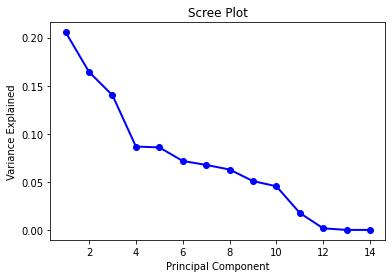

In [49]:
PC_values = np.arange(pca.n_components_) + 1
plt.plot(PC_values, pca.explained_variance_ratio_, 'o-', linewidth=2, color='blue')
plt.title('Scree Plot')
plt.xlabel('Principal Component')
plt.ylabel('Variance Explained')
plt.show()

Components to capture 80% of variance:  7


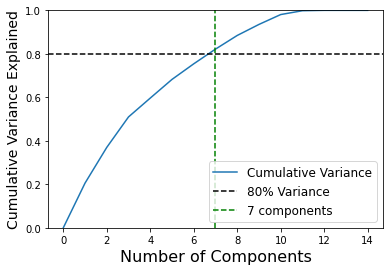

In [50]:
# get the cumulative variance
cum_var = exp_var.cumsum()

# find the number of components
index_80 = sum(cum_var <= 0.8)

# indices are zero-indexed, so the total number is one more than this
print('Components to capture 80% of variance: ', index_80+1)

# add a zero at the start so the plot extends all the way down
cum_var_plot = [0] + list(cum_var)

# plot
fig, ax = plt.subplots()
ax.plot(range(len(cum_var_plot)), cum_var_plot, label = 'Cumulative Variance')

# add some lines to illustrate the question
ax.axhline(0.8, color = 'k', linestyle = '--', label = '80% Variance')
ax.axvline(index_80+1, color = 'g', linestyle = '--', label = str(index_80+1)+ ' components')

# limit the y axes
ax.set_ylim([0, 1])

# axes labels and legend
ax.set_xlabel('Number of Components', fontsize = 16)
ax.set_ylabel('Cumulative Variance Explained', fontsize = 14)
_ = ax.legend(fontsize = 12)

In [51]:
cum_var

array([0.20560202, 0.36986309, 0.50988438, 0.59658805, 0.68242071,
       0.75413746, 0.82172056, 0.88454572, 0.93531702, 0.98071707,
       0.99835185, 1.        , 1.        , 1.        ])

In [52]:
pca_red = decomposition.PCA(n_components = 4).fit(data_norm)
scores_pca = pca_red.transform(data_norm)

k means clustering with PCA

In [53]:
kmeans = cluster.KMeans(n_clusters = 22, init = 'k-means++', random_state = 42)
kmeans = kmeans.fit(scores_pca)

In [54]:
df_segm_pca_kmeans = pd.concat([data_norm, pd.DataFrame(scores_pca)], axis =1)
df_segm_pca_kmeans.columns.values[-4:] = ["Component 1", "Component 2", "Component 3", "Component 4"]

df_segm_pca_kmeans["segment kmeansPCA"] = kmeans.labels_


In [55]:
df_segm_pca_kmeans["Segment"] =  df_segm_pca_kmeans["segment kmeansPCA"].map({0:'1st', 
1:"2nd",
2: "3rd",
3: "4th",
4:"5th",
5:"6th",
6:"7th",
7:"8th",
8:"9th",
9:"10th",
10:"11th",
11:"12th",
12:"13th",
13:"14th",
14:"15th",
15:"16th",
16:"17th",
17:"18",
18:"19th",
19:"20th",
20:"21st",
21:"22nd",
22:"23rd"})

In [56]:
x_axis = df_segm_pca_kmeans["Component 2"]
y_axis = df_segm_pca_kmeans["Component 1"]

c:\Users\sicil\miniconda3\envs\massliver\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


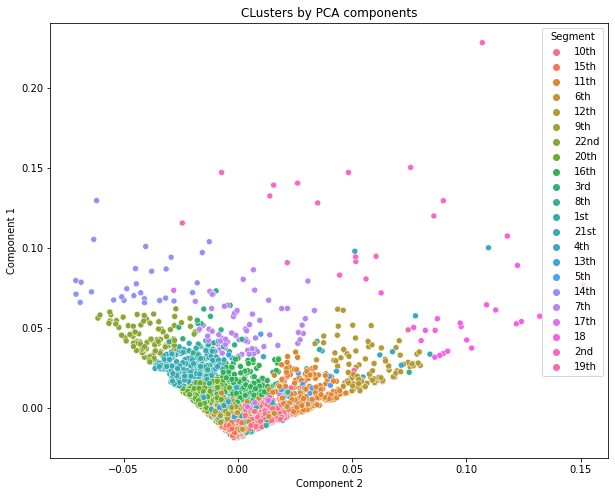

In [57]:
plt.figure(figsize= (10,8))
sns.scatterplot(x_axis, y_axis, hue = df_segm_pca_kmeans["Segment"], 
# palette = ['g', 'r', 'c', 'm',]
)
plt.title("CLusters by PCA components")
plt.show()

look at eigenvalues, how many evals are needed for this much variance

Scree plot


keep the number of PCA componenets bewteen 3 and 5 tops
incerase samples, drive down the componenets

after the PCA--> elbow plot
k emans clustering--> elbow plot



In [58]:
df_st =  StandardScaler().fit_transform(percs_df.T)  
pd.DataFrame(df_st, columns=percs_df.T.columns).head(2)

RXN,kf_HEX1,kf_PGI,kf_FBP,kf_PFK,kf_FBA,kf_TPI,kf_GAPD,kf_PGK,kf_PGM,kf_ENO,kf_PYK,kf_LDH_L,kf_ATPM,kf_NADHM
0,-0.348664,0.251604,0.0,-0.506614,-0.417382,0.443916,-0.032191,-0.338296,0.936504,1.067993,-0.457825,-0.195830,-0.410686,0.0
1,-0.441675,-0.561197,0.0,-0.595781,-0.354029,-0.428223,-0.373802,-0.219239,0.812118,0.880745,0.276280,-0.385221,-0.741565,0.0


In [59]:
pca_out = PCA().fit(df_st)
pca_out.explained_variance_ratio_
np.cumsum(pca_out.explained_variance_ratio_)
loadings = pca_out.components_
num_pc = pca_out.n_features_
pc_list = ["PC"+str(i) for i in list(range(1, num_pc+1))]
loadings_df = pd.DataFrame.from_dict(dict(zip(pc_list, loadings)))
loadings_df['variable'] = percs_df.T.columns.values
loadings_df = loadings_df.set_index('variable')
loadings_df

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14
variable,,,,,,,,,,,,,,
kf_HEX1,0.362697,-2.534846e-01,-6.049080e-02,-1.886871e-01,5.460388e-02,6.231280e-02,-3.159774e-01,-6.329079e-01,0.413427,1.091363e-01,0.273522,-2.970091e-03,-6.257073e-18,0.0
kf_PGI,0.023318,-2.331032e-02,7.552987e-02,8.184692e-01,-3.133368e-02,-4.556278e-01,-2.782523e-02,-1.345773e-01,0.271748,5.538983e-02,-0.137576,-3.178782e-03,8.520451e-17,0.0
kf_FBP,0.000000,1.110223e-16,-8.326673e-17,5.551115e-17,9.714451e-17,1.942890e-16,-1.665335e-16,-5.551115e-17,0.000000,-3.191891e-16,0.000000,-3.642919e-16,-1.000000e+00,0.0
kf_PFK,0.427313,-2.937408e-01,-4.888370e-03,2.201942e-01,-8.364833e-03,-1.141218e-01,-1.210631e-01,1.827587e-01,-0.515121,-2.947377e-01,0.518883,6.562364e-04,1.873174e-16,0.0
kf_FBA,0.015009,1.948339e-02,-6.461550e-02,4.831981e-01,5.804949e-02,8.691255e-01,-7.677671e-03,-4.942167e-02,0.000955,-1.930013e-02,-0.009307,5.406539e-03,-1.584695e-16,0.0
kf_TPI,-0.015841,3.069542e-03,1.687790e-01,-1.048232e-02,9.533057e-01,-4.080784e-02,-3.187745e-02,1.385096e-01,0.132301,-1.506694e-01,0.016750,-1.616458e-04,2.644488e-16,0.0
kf_GAPD,0.045137,2.285503e-02,6.996783e-01,1.574618e-02,4.180115e-02,4.463112e-02,-2.778596e-02,-1.456066e-01,-0.348131,6.000379e-01,0.026195,1.842558e-03,-2.688726e-17,0.0
kf_PGK,0.441589,-2.501489e-02,4.522062e-02,-3.304791e-02,-9.138106e-02,6.578671e-02,2.424052e-01,5.922675e-01,0.479949,3.434999e-01,0.169219,-4.514882e-02,-1.350721e-16,0.0
kf_PGM,0.284642,5.917940e-01,-5.523274e-02,4.081991e-03,1.350669e-02,-2.625432e-02,-2.419208e-01,-2.950758e-02,-0.080057,-3.893889e-02,-0.053959,-7.032684e-01,4.160146e-16,0.0


Generated correlation matrix plot for loadings

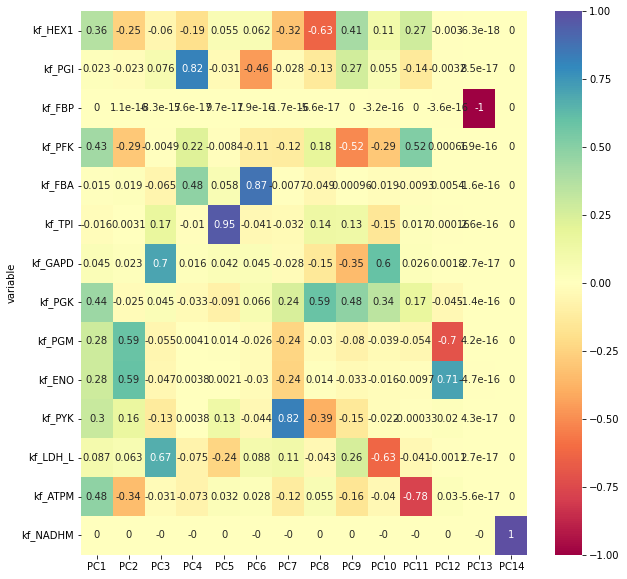

In [60]:
plt.figure(figsize= (10,10))
ax = sns.heatmap(loadings_df, annot=True, cmap='Spectral')

plt.show()

Next steps:
possibly removing NADHM, add sinks and sources
see differences bw PC 2/3

change conc flexbilties
variation, see convergence

potentially see sample sizes, and 
make sure fluxes and conc units align (b4 presnetnig)




In [ ]:
liver.reactions.PGK

NameError: name 'liver' is not defined

In [ ]:

ax = sns.heatmap(loadings_df, annot=True, cmap='Spectral')
plt.show()

NameError: name 'loadings_df' is not defined

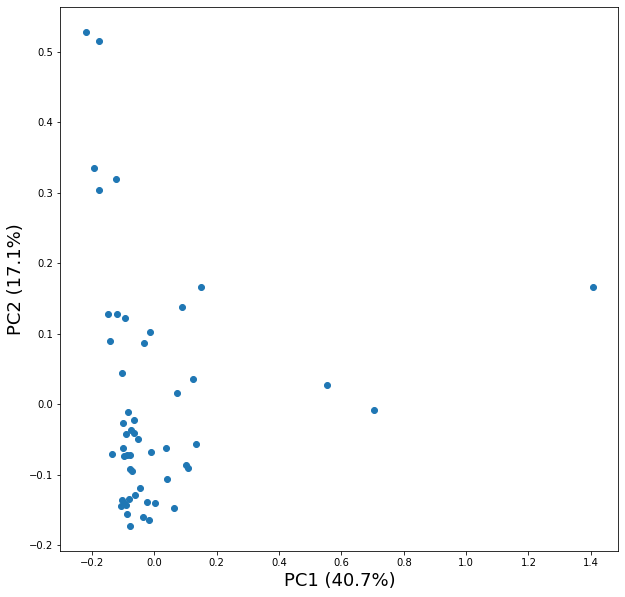

In [ ]:
# ANSWER
pc1 = pc_genes.loc[0].to_frame('weight')
pc2 = pc_genes.loc[1].to_frame('weight')

# need the absolute values to sort by
pc1['abs_weight'] = pc1.weight.abs()
pc2['abs_weight'] = pc2.weight.abs()

# sort and keep only the top 5
pc1 = pc1.sort_values('abs_weight', ascending = False).iloc[0:5]
pc2 = pc2.sort_values('abs_weight', ascending = False).iloc[0:5]

# concatenate the gene table info
# pc1 = pd.concat([pc1, gene_table.loc[pc1.index]], axis = 1)
# pc2 = pd.concat([pc2, gene_table.loc[pc2.index]], axis = 1)
fig, ax = plt.subplots(figsize = (10, 10))

# scatter the sample loadings
ax.scatter(pc_samples[0], pc_samples[1])

# add the labels, use the exp_var
ax.set_xlabel('PC1 (%.1f%%)'%(exp_var[0]*100), fontsize = 18)
ax.set_ylabel('PC2 (%.1f%%)'%(exp_var[1]*100), fontsize = 18)

# add the arrows
# begin by getting the genes from 1.3.1
# arrows_to_make = pc1.index.append(pc2.index)

# # this would get crowded, so remove specific genes that overlap
# arrows_to_make = arrows_to_make.drop(['b3361','b3519', 'b0948', 'b3411'])

# arrow length variable extends arrows to help in interpreting the plot
# text_scale determines how far text labels are from arrow tips (1 = on top of them)
arrow_length = 500
text_scale = 1.3

# the place the arrows start is up to you, so you can move it out of the way
start1 = 25
start2 = 40

# loop through each gene and add its arrow
# for g in arrows_to_make:
#     # directions in PC1 and 2
#     g_weight_pc1 = pc_genes.loc[0, g]
#     g_weight_pc2 = pc_genes.loc[1, g]
    
#     # lengthen arrow by a constant factor
#     g_weight_pc1 = g_weight_pc1 * arrow_length
#     g_weight_pc2 = g_weight_pc2 * arrow_length
    
#     # add the arrow
#     ax.arrow(start1, start2, g_weight_pc1, g_weight_pc2, head_width = 2)
    
#     # add the gene's name to the plot
#     g_name = gene_table.gene_name[g]
#     ax.text(start1 + (text_scale * g_weight_pc1),
#             start2 + (text_scale * g_weight_pc2), 
#             g_name)

looking for correlation, 
larger- negatively
smaller- positively
90- indepenedt
so therefore looking at how much weight each perc has
can we see if specific percs 
is there a specific perc(s) that can be attributed to a specific component
look at atatching loadings on PC1, theire wieghts


Set-up plots, to identify what the dots are 
make moseouver using altair
3d--> plotly

make something to pull up omcponenets?

colour the points absed on subsystem

increase the number of sample points

### Next Steps:
1) looking at overlaps of Perc values
2) 

1) Plot a 45 deg line on above graph, make a line for 0,0
